### **Итоговое задание Альмиры и Соколова Александра**  
### по Проекту 6. Car Price prediction 
####  Юнит 6. Основные алгоритмы машинного обучения. Часть II (отредактирован 9.9.2020)
---

### 1. Импорт библиотек

In [220]:
import pandas as pd
import pandas_profiling
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import re
from sklearn.feature_selection import f_classif, mutual_info_classif

# потом удалить
# import seaborn as sns
#

# from math import log as log
# from sklearn.model_selection import train_test_split 
# from sklearn.ensemble import RandomForestRegressor 
# from sklearn import metrics
# from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
# from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
# from sklearn.preprocessing import PolynomialFeatures
# from collections import Counter
# import datetime


# import seaborn as sns 



# import copy
# from IPython.display import display
# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import confusion_matrix
# from sklearn.metrics import auc, roc_auc_score, roc_curve
# from sklearn.model_selection import StratifiedShuffleSplit
# from sklearn.feature_selection import f_classif, mutual_info_classif
# from sklearn.model_selection import GridSearchCV
# from sklearn.model_selection import cross_val_score
# from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS

from importlib import reload

import os
print(os.listdir('./data'))
PATH_to_file = './data/'

['all_auto_ru_09_09_2020.csv', 'all_auto_ru_24_08_2020.csv', 'auto_ru.csv', 'bmw_auto_ru_24_08_2020.csv', 'bmw_auto_ru_small_24_08_2020.csv', 'sample_submission.csv', 'test.csv']


In [124]:
import utils_module09092020 as utils

In [125]:
RANDOM_SEED = 42
!pip freeze > requirements.txt
CURRENT_DATE = pd.to_datetime('09/09/2020')

### 2. Импорт данных

In [126]:
df_train = pd.read_csv(PATH_to_file+'all_auto_ru_09_09_2020.csv')
df_test = pd.read_csv(PATH_to_file+'test.csv')
df_submit = pd.read_csv(PATH_to_file+'sample_submission.csv')
pd.set_option('display.max_columns', None)
print('Размерность тренировочного датасета: ', df_train.shape)
display(df_train.head(2))
print('Размерность тестового датасета: ', df_test.shape)
display(df_test.head(2))
print('Размерность датасета c примером сабмишена: ', df_submit.shape)
display(df_submit.head(2))

Размерность тренировочного датасета:  (89378, 26)


,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,mileage,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Таможня,Владение,price,start_date,hidden,model
0,Седан,AUDI,040001,бензин,1990.0,2.8 MT (174 л.с.) 4WD,4.0,1991,SEDAN MECHANICAL 2.8,MECHANICAL,2.8,174.0,"Машина в приличном состоянии ,не гнилая не р...",350000,{'id': '0'},полный,LEFT,NaN,3.0,ORIGINAL,True,NaN,200000.0,2019-10-03T08:09:11Z,NaN,100
1,Седан,AUDI,EE1D19,бензин,1982.0,1.8 MT (90 л.с.),4.0,1986,SEDAN MECHANICAL 1.8,MECHANICAL,1.8,90.0,Машина в оригинале не гнилая все вопросы по те...,173424,{'id': '0'},передний,LEFT,NaN,3.0,ORIGINAL,True,NaN,60000.0,2020-09-06T06:49:40Z,NaN,100


Размерность тестового датасета:  (3837, 23)


,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,mileage,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Таможня,Владение,id
0,седан,BMW,чёрный,дизель,2016.0,520d 2.0d AT (190 л.с.),4.0,2017.0,SEDAN AUTOMATIC 2.0,автоматическая,2.0 LTR,190 N12,В РОЛЬФ Ясенево представлено более 500 автомоб...,158836.0,"['[{""name"":""Безопасность"",""values"":[""Антипробу...",задний,Левый,Не требует ремонта,1 владелец,Оригинал,Растаможен,NaN,0
1,седан,BMW,белый,дизель,2018.0,318d 2.0d AT (150 л.с.),4.0,2019.0,SEDAN AUTOMATIC 2.0,автоматическая,2.0 LTR,150 N12,Автомобиль из демонстрационного парка по спец ...,10.0,"['[{""name"":""Комфорт"",""values"":[""Круиз-контроль...",задний,Левый,Не требует ремонта,1 владелец,Оригинал,Растаможен,NaN,1


Размерность датасета c примером сабмишена:  (3837, 2)


,id,price
0,0,5299000.0
1,1,1580000.0


### 2. Проверка и доработка датасета после парсинга для слияния с тестом

In [127]:
# сравним датасеты 
utils.check_df_before_merg(df_train, df_test)

,# уник_1,в первой строке_1,тип_1,имя признака_1,имя признака_2,тип_2,в первой строке_2,# уник_2
0,168.0,Седан,object,bodyType,bodyType,object,седан,11.0
1,36.0,AUDI,object,brand,brand,object,BMW,1.0
2,16.0,040001,object,color,color,object,чёрный,15.0
3,6.0,бензин,object,fuelType,fuelType,object,дизель,4.0
4,78.0,1990,float64,modelDate,modelDate,float64,2016,31.0
5,4484.0,2.8 MT (174 л.с.) 4WD,object,name,name,object,520d 2.0d AT (190 л.с.),384.0
6,5.0,4,float64,numberOfDoors,numberOfDoors,float64,4,4.0
7,80.0,1991,int64,productionDate,productionDate,float64,2017,37.0
8,1860.0,SEDAN MECHANICAL 2.8,object,vehicleConfiguration,vehicleConfiguration,object,SEDAN AUTOMATIC 2.0,99.0
9,4.0,MECHANICAL,object,vehicleTransmission,vehicleTransmission,object,автоматическая,3.0


Резюме:
 1. Не совпали типы в:= 11 столбцах

2. Уникальные значения заоблачно различаются в:= 10 столбцах [0, 1, 4, 5, 7, 8, 10, 11, 12, 13]


,имя признака_1,не совпадают типы,имя признака_2
index,,,
7,productionDate,int64!=float64,productionDate
11,enginePower,float64!=object,enginePower
13,mileage,int64!=float64,mileage
17,Состояние,float64!=object,Состояние
18,Владельцы,float64!=object,Владельцы
20,Таможня,bool!=object,Таможня
22,price,float64!=nan,NaN
23,start_date,object!=nan,NaN
24,hidden,float64!=nan,NaN


In [128]:
# починим датасет перед использованием и приведем его к виду теста

# на первый взгляд может, что перевод во float достаточно бесмыссленный шаг ведь кол-во дверей автомобиля это целое число. Но напомню что мы сейчас на этапе приведения датасета после парсинга к виду тестового. На этапе анализа датасета мы сможем более детально посмотреть что происходит в тестовом датасете (вероятно там есть ошибки которые надо исправить и мы можем потерять эту информацию не знаю сколько ошибок и какие они) 

# начнем с int64!=float64 и приведем все к float 
list_cols_to_repair = ['productionDate', 'mileage']
for col in list_cols_to_repair:
        df_train[col] = df_train[col].astype('float64')

# теперь починим int64!=float64 и приведем все к object
list_cols_to_repair = ['enginePower', 'Состояние', 'Владельцы']
for col in list_cols_to_repair:
        df_train[col] = df_train[col].astype('object')

# теперь починим bool!=object
# предварительно райдем в датасет и убедимся, что True соответсвует Растаможен зайдя на сайте (этот код тут не приводится, чтобы не нагружать ноутбук)
df_train['Таможня'] = df_train['Таможня'].map({True: 'Растаможен', False:'Не растаможен'})

In [129]:
utils.check_df_before_merg(df_train, df_test)

,# уник_1,в первой строке_1,тип_1,имя признака_1,имя признака_2,тип_2,в первой строке_2,# уник_2
0,168.0,Седан,object,bodyType,bodyType,object,седан,11.0
1,36.0,AUDI,object,brand,brand,object,BMW,1.0
2,16.0,040001,object,color,color,object,чёрный,15.0
3,6.0,бензин,object,fuelType,fuelType,object,дизель,4.0
4,78.0,1990,float64,modelDate,modelDate,float64,2016,31.0
5,4484.0,2.8 MT (174 л.с.) 4WD,object,name,name,object,520d 2.0d AT (190 л.с.),384.0
6,5.0,4,float64,numberOfDoors,numberOfDoors,float64,4,4.0
7,80.0,1991,float64,productionDate,productionDate,float64,2017,37.0
8,1860.0,SEDAN MECHANICAL 2.8,object,vehicleConfiguration,vehicleConfiguration,object,SEDAN AUTOMATIC 2.0,99.0
9,4.0,MECHANICAL,object,vehicleTransmission,vehicleTransmission,object,автоматическая,3.0


Резюме:
 1. Не совпали типы в:= 5 столбцах

2. Уникальные значения заоблачно различаются в:= 10 столбцах [0, 1, 4, 5, 7, 8, 10, 11, 12, 13]


,имя признака_1,не совпадают типы,имя признака_2
index,,,
22,price,float64!=nan,NaN
23,start_date,object!=nan,NaN
24,hidden,float64!=nan,NaN
25,model,object!=nan,NaN
26,NaN,nan!=int64,id


Резюме - несоответствие типов осталось в 5 столбцах \[price, start_date, hidden, model, id\], в том числе price - целевая переменная которую мы будем моделировать, три столбца чтобы попробовать обогатить данные, и столбцец id, который нам будет нужен для формирования файла submition.  
Теперь обратим внимание на значения и приведем их к общему виду 

In [130]:
# bodyType - надо привести значения к нижнему регистру (оставим закадром, проверку уникальных значений трейна и теста, чтобы прийти к такому выводу)
df_train['bodyType'] = df_train['bodyType'].apply(lambda x: str(x).lower())
utils.nunique_not_found(df_train, df_test, 'bodyType')


# color - цвета спарсились в шестнадцатеричном коде цветов. Но их всего 16 поэтому воспользуемся сайтом (https://hysy.org/color) и сделаем словарь цветов. (оставим закадром, проверку уникальных значений трейна и теста, чтобы сделать соответсвия цветов) 
dict_color = {'040001':'чёрный', 'EE1D19':'красный', '0000CC':'синий', 
              'CACECB':'серебристый', '007F00':'зелёный', 'FAFBFB':'белый', 
              '97948F':'серый', '22A0F8':'голубой', '660099':'пурпурный', 
              '200204':'коричневый', 'C49648':'бежевый', 'DEA522':'золотистый', 
              '4A2197':'фиолетовый', 'FFD600':'жёлтый', 'FF8649':'оранжевый', 
              'FFC0CB':'розовый'}
df_train['color'] = df_train['color'].map(dict_color)
utils.nunique_not_found(df_train, df_test, 'color')

# Руль - ну тут все просто - Правый или Левый в нижнем регистре с большой буквы
df_train['Руль'] = df_train['Руль'].map({'RIGHT':'Правый', 'LEFT':'Левый'})
utils.nunique_not_found(df_train, df_test, 'Руль')

# ПТС - тут все просто - Оригинал или Дубликат в нижнем регистре с большой буквы
df_train['ПТС'] = df_train['ПТС'].map({'ORIGINAL':'Оригинал', 'DUPLICATE':'Дубликат'})
utils.nunique_not_found(df_train, df_test, 'ПТС')

# Владельцы - Оригинал или Дубликат в нижнем регистре с большой буквы
df_train['Владельцы'] = df_train['Владельцы'].map({3.0:'3 или более', 2.0:'2\xa0владельца', 1.0:'1\xa0владелец'})
utils.nunique_not_found(df_train, df_test, 'Владельцы')

# Владение - в таблице сверху в первых строках Nan поэтому нужно отдельно проверить
# оказалось что в тесте очень сложная строковая запись тогда как в трейне в значениях более структурируемые словари (УчТЕМ этот момент и разберем этот столбец на этапе анализа, вероятно будет сразу полезно создать дополнительные временные фичи) 
utils.nunique_not_found(df_train, df_test, 'Владение');

в столбце:= bodyType в трейне НЕ НАЙДЕНО:= 0 уникальных значений из теста
в столбце:= color в трейне НЕ НАЙДЕНО:= 0 уникальных значений из теста
в столбце:= Руль в трейне НЕ НАЙДЕНО:= 0 уникальных значений из теста
в столбце:= ПТС в трейне НЕ НАЙДЕНО:= 0 уникальных значений из теста
в столбце:= Владельцы в трейне НЕ НАЙДЕНО:= 0 уникальных значений из теста
в столбце:= Владение в трейне НЕ НАЙДЕНО:= 157 уникальных значений из теста


Резюме - несоответсвие значений в одинаковых типах осталось только в одном столбце - Владение, но приведение к единому виду целеообразно оставить до детально анализа по переменным, так как там зашиты данные о годе и месяце владения и в процессе обработке может быть сразу целесообразно будет создавать новые временные фичи.  

### 3. Слияние датасетов в один

In [131]:
# ВАЖНО! для корректной обработки признаков объединяем трейн и тест в один датасет
df_train['Train'] = 1 # помечаем где у нас трейн
df_test['Train'] = 0 # помечаем где у нас тест

df = df_train.append(df_test, sort=False).reset_index(drop=True) # объединяем
#!Обратите внимание объединение датасетов является потенциальной опасностью для даталиков

In [132]:
# провека  после слияния
df.head(2)

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,mileage,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Таможня,Владение,price,start_date,hidden,model,Train,id
0,седан,AUDI,чёрный,бензин,1990.0,2.8 MT (174 л.с.) 4WD,4.0,1991.0,SEDAN MECHANICAL 2.8,MECHANICAL,2.8,174,"Машина в приличном состоянии ,не гнилая не р...",350000.0,{'id': '0'},полный,Левый,NaN,3 или более,Оригинал,Растаможен,NaN,200000.0,2019-10-03T08:09:11Z,NaN,100,1,NaN
1,седан,AUDI,красный,бензин,1982.0,1.8 MT (90 л.с.),4.0,1986.0,SEDAN MECHANICAL 1.8,MECHANICAL,1.8,90,Машина в оригинале не гнилая все вопросы по те...,173424.0,{'id': '0'},передний,Левый,NaN,3 или более,Оригинал,Растаможен,NaN,60000.0,2020-09-06T06:49:40Z,NaN,100,1,NaN


### 4. Предварительный анализ данных

In [11]:
# анализ тренировочной части
pandas_profiling.ProfileReport(df[df['Train']==1])

Render HTML: 100%|██████████| 1/1 [00:06<00:00,  6.52s/it]


In [12]:
# анализ валидационной части
pandas_profiling.ProfileReport(df[df['Train']==0])

Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.80s/it]


In [13]:
# выведем сводную информацию по датасету df без теста kaggle
utils.describe_without_plots_all_collumns(df[df['Train']==1], short=True)

,имя признака,тип,# значений,# пропусков(NaN),# уникальных,минимум,среднее,макс,медиана
0,bodyType,object,89378,0,168,NaN,NaN,NaN,NaN
1,brand,object,89378,0,36,NaN,NaN,NaN,NaN
2,color,object,89378,0,16,NaN,NaN,NaN,NaN
3,fuelType,object,89378,0,6,NaN,NaN,NaN,NaN
4,modelDate,float64,89377,1,78,1904,2008.54,2020,2009
5,name,object,89377,1,4484,NaN,NaN,NaN,NaN
6,numberOfDoors,float64,89377,1,5,0,4.51047,5,5
7,productionDate,float64,89378,0,80,1904,2010.83,2020,2011
8,vehicleConfiguration,object,89377,1,1860,NaN,NaN,NaN,NaN
9,vehicleTransmission,object,89377,1,4,NaN,NaN,NaN,NaN


In [14]:
# выведем сводную информацию по тесту
utils.describe_without_plots_all_collumns(df[df['Train']==0], short=True)

,имя признака,тип,# значений,# пропусков(NaN),# уникальных,минимум,среднее,макс,медиана
0,bodyType,object,3837,0,11,NaN,NaN,NaN,NaN
1,brand,object,3837,0,1,NaN,NaN,NaN,NaN
2,color,object,3837,0,15,NaN,NaN,NaN,NaN
3,fuelType,object,3837,0,4,NaN,NaN,NaN,NaN
4,modelDate,float64,3837,0,31,1975,2009.95,2019,2011
5,name,object,3837,0,384,NaN,NaN,NaN,NaN
6,numberOfDoors,float64,3837,0,4,2,4.37503,5,5
7,productionDate,float64,3837,0,37,1981,2011.93,2019,2013
8,vehicleConfiguration,object,3837,0,99,NaN,NaN,NaN,NaN
9,vehicleTransmission,object,3837,0,3,NaN,NaN,NaN,NaN


Резюме по предварительному анализу: (выводы идут по порядку выявления, а не по значимости)  
В тренировочной выборке 88968 строк, в тестовой 3837. Всего данных - 93215 строк. Всего 28 признаков, из них:
- 23 в тесте: 
  - 4 - числовых - mileage, modelDate, productionDate (один из них id - сервисный для генерации submition), 
  - 19 - категориальных (пока так, во время анализа, вероятно, какие-нибудь из них станут числовыми, например можность двигателя)
- 4 были добавлены во время парсинга: 1- числовой - price, 1 - временной ряд - start_date, 1 - бинарный - hidden, 1 - категориальный - model
- 1 - бинарный Train  - сервисный для разделения train и test
  
Детальная информация по трейну и тесту раздельно:  
- признак Таможня бесполезен так как содержит одно значение - Растаможен => удалим
- в трейне 2114 (2.4%) дубликатов по строкам => надо удалить
- высокая корреляция между modelDate и productionDate => надо еще внимательно посмотреть на этапе анализа перед тем как удалить
- пропуски в трейне:
  - description - 3254 (3.6%) => надо заполнить
  - Состояние - 89378 (100.0%) - мы не смогли во время парсинга раздобыть этот критерий => надо проанализировать заполненность этого признака в тесте и постараться заполнить по похожим критериям авто требующих ремонта - так как это влияет на цену 
  - Владельцы - 13588 (15.2%) => надо заполнить 
  - Владение - 60177 (67.3%) => надо заполнить
  - hidden - 89378 (100.0%) => надо удалить
  - id - 89378 (100.0%) - это столбец для генерации файла submition => ничего не делаем
- пропуски в тесте:
  - Владение - 2084 (54.3%) => надо заполнить
  - price, start_date, hidden, model - 3837 (100.0%) - дополнительные фичи => надо проанализировать и использовать для генерации новых фич или удалить
- между vehicleConfiguration и еще тремя признаками: vehicleTransmission, engineDisplacement, numberOfDoors - высокая корреляция => надо проверить это при анализе и при необходимости удалить
- в тесте:
  - brand - только одно значение - "BMW" => надо дополнительно собрать информацию с обзоров цен на BMW и постараться оставить для анализа автомобили со схожими характеристиками, которые влюяют на цену
  - Руль - только одно значение - "Левый" => надо взять из трейна только авто с Левым рулем
  - Состояние - только одно значение - "Не требует ремонта" => надо обратить внимание на выбросы снизу по цене из трейна, чтобы не брать в учет авто требующие ремонта

Описания полей датасета
- bodyType - тип кузова автомобиля (https://ru.wikipedia.org/wiki/Типы_автомобильных_кузовов)
- brand
- color	object
- fuelType
- modelDate
- name
- numberOfDoors
- productionDate
- vehicleConfiguration
- vehicleTransmission
- engineDisplacement
- enginePower - мощность двигателя (л.с.)
- description
- mileage - пробег автомобиля (км.) - представляет собой общее количество километров, которое это транспортное средство проехало по дорогам с момента своего схода с конвейера производителя. 
- Комплектация
- Привод - характеристика привода автомобиля, которое передает энергию от двигателя на колеса. Переднеприводные автомобили получают всю энергию двигателя на передние колеса. При заднем приводе энергия двигателя целиком поступает на задние колеса. Когда энергия двигателя передается на все четыре колеса автомобиля, такой привод является полным ('полный', 'передний', 'задний')
- Руль - характеристика руля по стороне расположения руля в автомобиле (Левый, Правый)
- Состояние
- Владельцы
- ПТС
- Таможня
- Владение
- price - цена указанная в объявлении на авто.ру
- start_date - дата размещения объявления на авто.ру
- hidden - характеристика объявления на авто.ру
- model - название модели автомобиля (не путать с маркой (брендом), например: бренд или марка - BMW, модель - M6)
- Train - сервисный для разделения train и test
- id - - сервисный для генерации submition

In [133]:
# внесем данные по типам переменных из резюме в списки 
# временной ряд (1)
time_cols = ['start_date']
# бинарная переменная (0) (hidden - не включаем так как решили удалить) итого  (0+1=1)
bin_cols = []
# категориальные переменные (19), ('Таможня' - не включаем  так как решили удалить) (19+1=20)
cat_cols = ['bodyType', 'brand', 'color', 'fuelType', 'name',
       'numberOfDoors', 'vehicleConfiguration',
       'vehicleTransmission', 'engineDisplacement', 'enginePower',
       'description', 'Комплектация', 'Привод', 'Руль', 'Состояние',
       'Владельцы', 'ПТС', 'Владение', 'model']
# числовые переменные (4) 
num_cols = ['mileage', 'modelDate', 'productionDate', 'price']
# сервисные переменные (2)
servis_cols = ['Train', 'id']
# итого 1+1+20+4+2=28
all_cols =cat_cols+num_cols+time_cols+servis_cols+bin_cols
print(f'Кол-во столбцов, для дальнейшей работы после предварительного анализа:= {len(all_cols)}')

Кол-во столбцов, для дальнейшей работы после предварительного анализа:= 26


In [134]:
# реализуем выводы из резюме перед детальным анализом по переменным
# берем только левый руль и тольк 26 столбцов
df = df.loc[df['Руль'] == 'Левый', all_cols]
# удаляем дубликаты
df = df.drop_duplicates()

### 5. Сбор дополнительной информации о BMW
---
Какие то важные факты для дальнейшего анализа с дополнениями и выводами:
- статистика по ценам обычно приводится по моделям, а в тесте признака модель нет => надо попробовать его восстановить
- существует общепринятое деление по классам - \[малый средний класс, средний класс, бизнес класс, представительский класс, внедорожники, купе, кабриолеты и родстеры\] => надо проверить возможно такая группировка позволит найти какие-то закономерности внутри классов
- обычно эта марка не включается в какие-то программы поддержки продаж для диллеров (типа сниженный процент от государства и т.п.)
- в России автомобили BMW собираются в Калининграде («Автотор») (3 серия, 5 серия, 7 серия, X3, X5, X1, X6) => соотвественно нет необходимости расстамаживать эти марки автомобилей
- увеличенный на 22 мм клиренс, более жёсткие амортизаторы и усиленные стабилизаторы, адаптированная под морозы электроника, сборка менее чувствительна к качеству бензина - это основные отличия русской сборки => вероятно диллеры учитывают ньансы для продажи авто в России, надо обратить внимание что входит в комплектацию, возможно есть вещи, которые существенно увеличивают стоимость
- ранее 3-4 летние авто сильно теряли в цене, теперь этот порог сдвинулся до 5-6 лет => вероятно это из-за расширения сроков гарантии на авто, когда подходят гарантия или пониженный по стоимости и более долгий техосмотр, владельцы продают автомобили
- на рынке этой марки в отличии от других присутсвует некоторая философия БМВ - в новом авто предположительно очень большая доля так называемых транзакционных издержек (оверхедов) + стоимость бренда, которые после покупки авто первым владельцем "сильно" снижаются, дальше для рынка остается себестоимость машины. Эта себестоимость торгуется на рынке, но BMW находит своих приверженцев, которые также платят чуть дороже, но за BMW, за свой стиль жизни, комфорт, за свою философию BMW => надо проверить действительно ли это так, сделать несколько срезов по маркам и моделям и оставить для анализа либо только БМВ либо авто, которые попадают в конкурентные с БМВ ниши.  

Использованы материалы с ресурсов:
- https://auto.ru/stats/cars/bmw/
- https://ru.wikipedia.org/wiki/BMW
- https://zen.yandex.ru/media/id/5987885f1410c361e4ba0f9c/bmv-nemeckoi-sborki-v-chem-otlichie-ot-kaliningradskih-mashin-5d4da573ec575b00ad872a7a  
и другие

### 6. Детальный анализ по переменным
---
### 6.1 bodyType 
начнем с типа кузова bodyType, чтобы убедиться в том что значения по всем маркам и моделям примерно одинаковые или наоборот и тогда убрать нерелевантные типы кузова

In [135]:
temp_df_Train = df[df['Train']==1]
temp_df_Test = df[df['Train']==0]
print(f'Всего в тесте типов кузова:= {temp_df_Test.bodyType.nunique()}')
print(f'Всего в трейне типов кузова:= {temp_df_Train.bodyType.nunique()}')

Всего в тесте типов кузова:= 11
Всего в трейне типов кузова:= 144


In [136]:
# посмотрим на них 
print(f'Список 11 типов кузова БМВ из теста:= {temp_df_Test.bodyType.unique()}')
print(f'Список первых 20 из 144 типов кузова из трейна:= {temp_df_Train.bodyType.unique()[:20]}')

Список 11 типов кузова БМВ из теста:= ['седан' 'внедорожник 5 дв.' 'хэтчбек 3 дв.' 'хэтчбек 5 дв.' 'купе'
 'родстер' 'лифтбек' 'универсал 5 дв.' 'кабриолет' 'седан 2 дв.'
 'компактвэн']
Список первых 20 из 144 типов кузова из трейна:= ['седан' 'универсал 5 дв.' 'хэтчбек 5 дв. sportback' 'хэтчбек 3 дв.'
 'хэтчбек 5 дв.' 'кабриолет' 'купе' 'лифтбек sportback' 'лифтбек'
 'седан long' 'внедорожник 5 дв.' 'кабриолет roadster' 'седан 2 дв.'
 'седан gran coupe' 'компактвэн' 'компактвэн gran tourer'
 'лифтбек gran turismo' 'хэтчбек 3 дв. compact' 'лифтбек gran coupe'
 'купе-хардтоп']


In [137]:
# оставляем только типы кузова как в тесте
list_bodyType_test = list(temp_df_Test.bodyType.unique())
df = df[df['bodyType'].isin(list_bodyType_test)]

***Резюме по bodyType:-*** Категориальный признак, оставили 11 типов кузовов, так как типы кузовов отличающиеся от кузовов в тесте очень специфичны и очень сильно влияют на класс автомобиля по которому по общим закономерностям формируется цена, оставим только типы кузова из теста, а потом после EDA проверим достаточно ли большая выборка трейна остается для моделирования или необходимо парсить другие сайты. Пропусков нет.

### 6.2 enginePower
забежим вперед и обработаем мощность двигателя потому что она нам потребуется для анализа марок

In [138]:
# вспомним что по результатам предварительного анализа эта переменная была отнесена к категориальнымu, посмотрим почему
temp_df_Train = df[df['Train']==1]
temp_df_Test = df[df['Train']==0]
display(temp_df_Train.enginePower[:5])
display(temp_df_Test.enginePower[:5])

0    174
1     90
2    136
3     90
4    101
Name: enginePower, dtype: object

89378    190 N12
89379    150 N12
89380    407 N12
89381    249 N12
89382    381 N12
Name: enginePower, dtype: object

In [139]:
# проверим все значения теста по мощности 
temp_df_Test.enginePower.unique()

array(['190 N12', '150 N12', '407 N12', '249 N12', '381 N12', '245 N12',
       '177 N12', '184 N12', '115 N12', '231 N12', '156 N12', '306 N12',
       '218 N12', '136 N12', '235 N12', '286 N12', '122 N12', '265 N12',
       '258 N12', '340 N12', '355 N12', '170 N12', '333 N12', '192 N12',
       '610 N12', '264 N12', '555 N12', '313 N12', '272 N12', '450 N12',
       '445 N12', '400 N12', '320 N12', '530 N12', '204 N12', '269 N12',
       '560 N12', '143 N12', '431 N12', '575 N12', '193 N12', '140 N12',
       '420 N12', '163 N12', '105 N12', '326 N12', '625 N12', '300 N12',
       '329 N12', '367 N12', '460 N12', '197 N12', '360 N12', '113 N12',
       '100 N12', '370 N12', '374 N12', '462 N12', '188 N12', '544 N12',
       '129 N12', '102 N12', '600 N12', '118 N12', '125 N12', '507 N12',
       '609 N12', '252 N12', '410 N12', '347 N12', '449 N12', '243 N12',
       '230 N12', '211 N12', '90 N12'], dtype=object)

In [140]:
# в тесте вытащим значение мощности перед строкой ' N12'
df.loc[df['Train']==0, 'enginePower'] = df[df['Train']==0]['enginePower'].apply(lambda x: int(x.split()[0]))

In [141]:
# переводим в int64
df['enginePower'] = df['enginePower'].astype('int64')

# перенесем признак в числовые
cat_cols.remove('enginePower')
num_cols.append('enginePower')

In [142]:
utils.describe_without_plots('enginePower', df[df['Train']==1].enginePower)

,enginePower
кол-во строк,79193
тип значений,int64
кол-во значений,79193
кол-во NaN,0
среднее,169.323
медиана,150
мин,11
макс,800


In [143]:
# очень странное минимальное значение можности, давайте посмотрим минимум мощности на тесте 
utils.describe_without_plots('enginePower', df[df['Train']==0].enginePower)

,enginePower
кол-во строк,3837
тип значений,int64
кол-во значений,3837
кол-во NaN,0
среднее,242.546
медиана,231
мин,90
макс,625


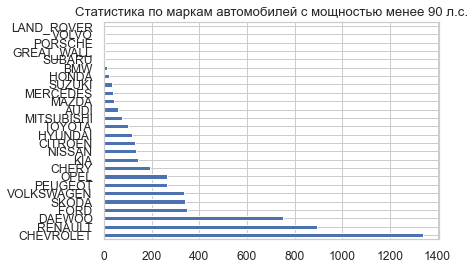

In [144]:
df[(df['Train']==1) & (df['enginePower']<90)]['brand'].value_counts().plot(kind = 'barh', title='Cтатистика по маркам автомобилей с мощностью менее 90 л.с.')

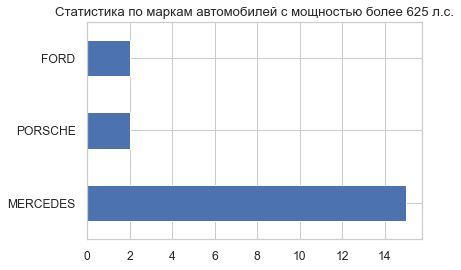

In [145]:
df[(df['Train']==1) & (df['enginePower']>625)]['brand'].value_counts().plot(kind = 'barh', title='Cтатистика по маркам автомобилей с мощностью более 625 л.с.')

In [146]:
# удалим значения мощностей меньше 90 и выше 625
df=df[(df['enginePower']<=625) & (df['enginePower']>=90)]

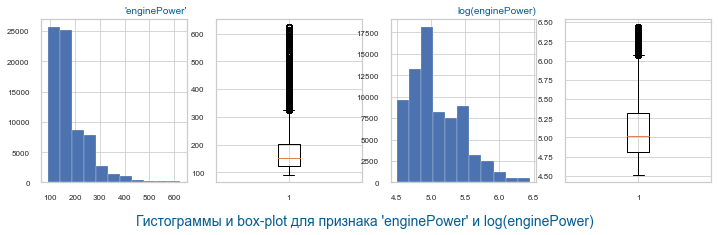

In [147]:
utils.four_plot_with_log2('enginePower', df[df['Train']==1])

***Резюме по enginePower:-*** обработали строки и перевели мощность в int64. Пропусков нет. Было какое-то небольшое значение мощности в трейне равное 11. Через это вышли на сравнение мощности с тестом и обрезали трейн по мощности двигателя то теста (более 90 и менее 625). О характере распределения и выбросах говорить пока рано, так как предстоит фильтрация по бренду, целесообразно вернуться к более детальному анализу после того как датасет устаканится. 

### 6.3 brand
теперь посмотрим на марки - brand

In [148]:
print(f'Всего в датасета марок:= {df.brand.nunique()}')

Всего в датасета марок:= 36


Вероятно не все из них нам подходят, сделаем сводные таблицы и посмотрим на средние значения цен по автомобилям по годам

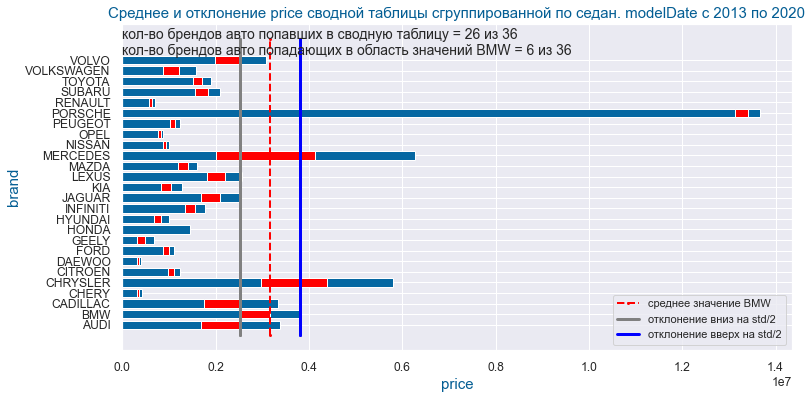

Список релевантных брендов:  AUDI CADILLAC CHRYSLER LEXUS MERCEDES VOLVO


In [149]:
list_brand0 = utils.hbar_group_pivot_table(list_bodyType_test[0], 'price', df[df['Train']==1], 2013, 2020, 1.1)

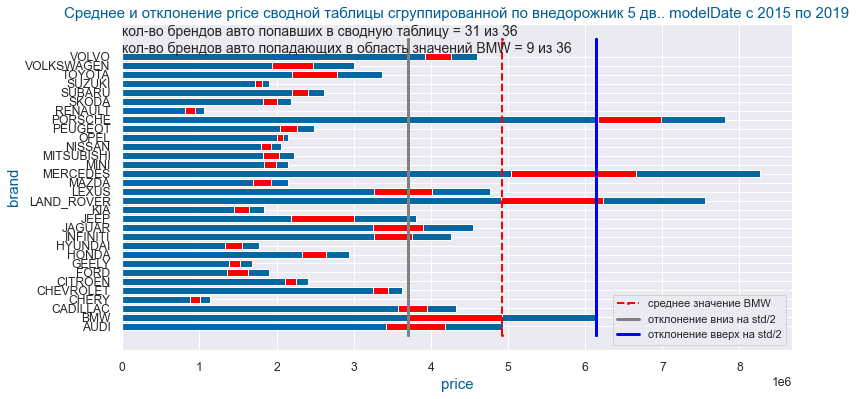

Список релевантных брендов:  AUDI CADILLAC INFINITI JAGUAR JEEP LAND_ROVER LEXUS MERCEDES VOLVO


In [150]:
list_brand1 = utils.hbar_group_pivot_table(list_bodyType_test[1], 'price', df[df['Train']==1], 2015, 2019, 1.1)

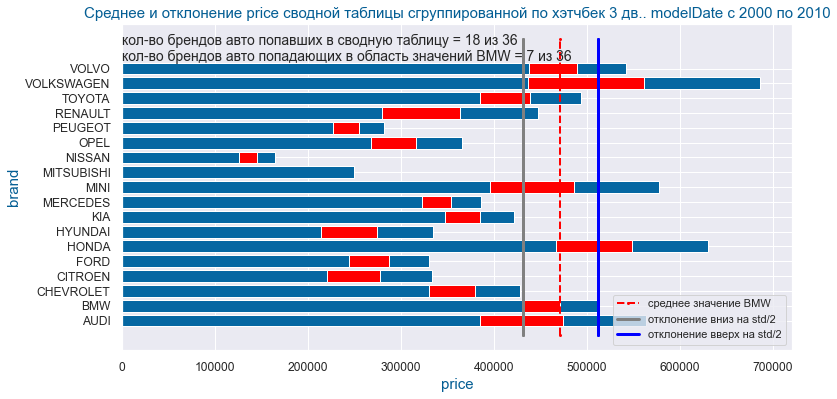

Список релевантных брендов:  AUDI HONDA MINI RENAULT TOYOTA VOLKSWAGEN VOLVO


In [151]:
list_brand2 = utils.hbar_group_pivot_table(list_bodyType_test[2], 'price', df[df['Train']==1], 2000, 2010, 1.1)

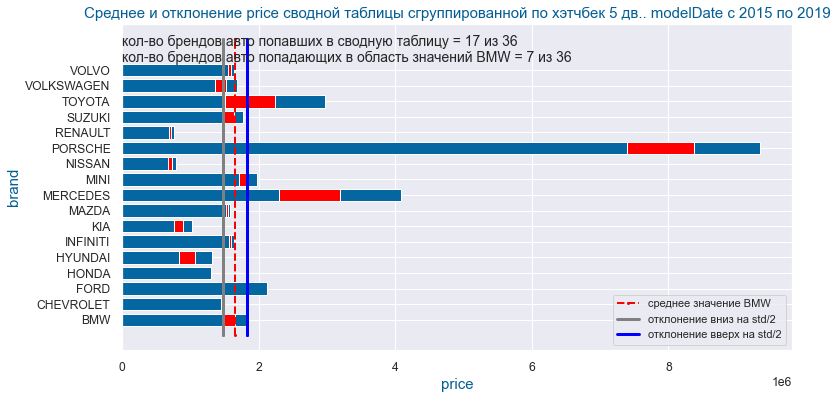

Список релевантных брендов:  INFINITI MAZDA MINI SUZUKI TOYOTA VOLKSWAGEN VOLVO


In [152]:
list_brand3 = utils.hbar_group_pivot_table(list_bodyType_test[3], 'price', df[df['Train']==1], 2015, 2019, 1.1)

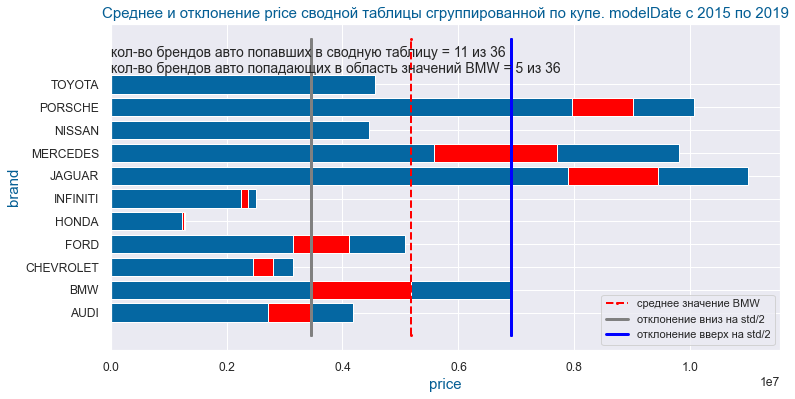

Список релевантных брендов:  AUDI FORD MERCEDES NISSAN TOYOTA


In [153]:
list_brand4 = utils.hbar_group_pivot_table(list_bodyType_test[4], 'price', df[df['Train']==1], 2015, 2019, 1.1)

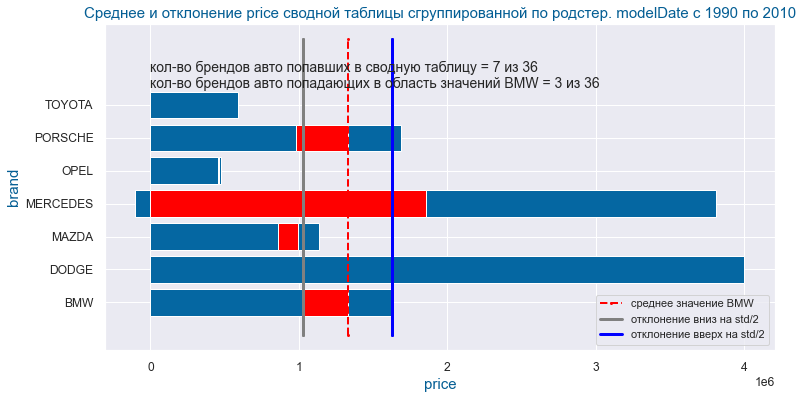

Список релевантных брендов:  MAZDA MERCEDES PORSCHE


In [154]:
list_brand5 = utils.hbar_group_pivot_table(list_bodyType_test[5], 'price', df[df['Train']==1], 1990, 2010, 1.1)

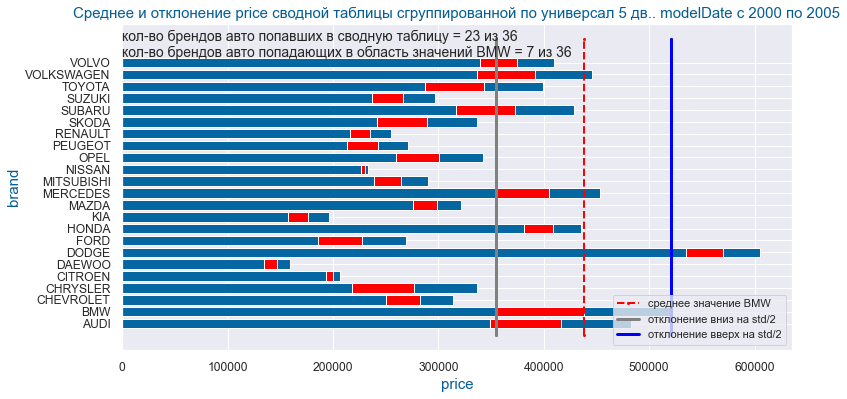

Список релевантных брендов:  AUDI HONDA MERCEDES SUBARU TOYOTA VOLKSWAGEN VOLVO


In [155]:
list_brand7 = utils.hbar_group_pivot_table(list_bodyType_test[7], 'price', df[df['Train']==1], 2000, 2005, 1.1)

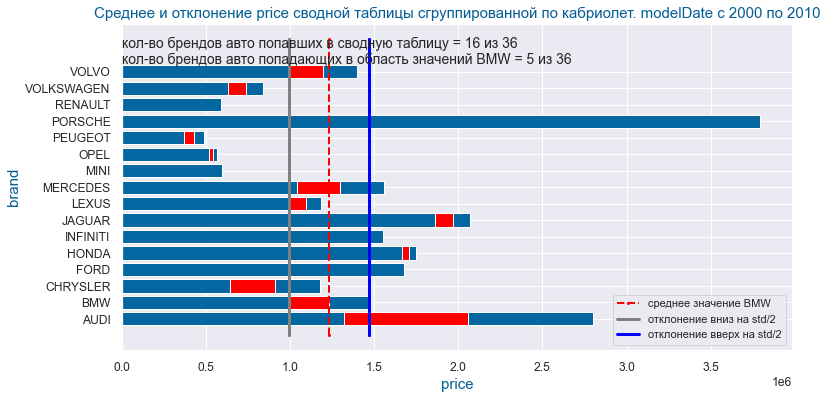

Список релевантных брендов:  AUDI CHRYSLER LEXUS MERCEDES VOLVO


In [156]:
list_brand8 = utils.hbar_group_pivot_table(list_bodyType_test[8], 'price', df[df['Train']==1], 2000, 2010, 1.1)

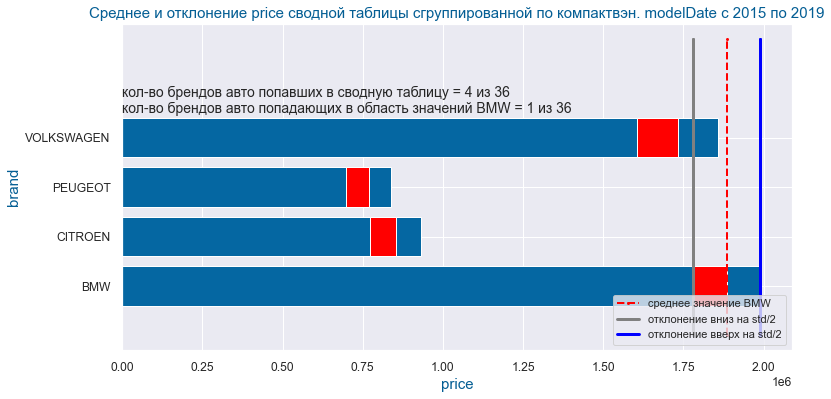

Список релевантных брендов:  VOLKSWAGEN


In [157]:
list_brand10 = utils.hbar_group_pivot_table(list_bodyType_test[10], 'price', df[df['Train']==1], 2015, 2019, 1.1)

In [158]:
# список всех релевантных моделей
list_final_brand=list(set(list_brand0+list_brand1+list_brand2+list_brand3+list_brand4+list_brand5+list_brand7+list_brand8+list_brand10))
print('Список релевантных брендов авто:\n',*list_final_brand, '\n, их кол-во:=', len(list_final_brand), 'из 36')
print()

Список релевантных брендов авто:
 LEXUS SUBARU LAND_ROVER FORD SUZUKI PORSCHE JEEP HONDA MERCEDES RENAULT VOLVO MINI AUDI CADILLAC TOYOTA NISSAN VOLKSWAGEN INFINITI MAZDA JAGUAR CHRYSLER 
, их кол-во:= 21 из 36



In [159]:
# кроме этого в трейне нет некоторых авто БМВ с типом кузова
print('В трейне не оказалось авто БМВ с типом кузова:=', list_bodyType_test[6])
temp_df_Train = df[df['Train']==1]
temp=list(temp_df_Train[temp_df_Train['bodyType']==list_bodyType_test[6]].brand.unique())
print('Список брендов авто с типом кузова', list_bodyType_test[6], ':=', *temp)

В трейне не оказалось авто БМВ с типом кузова:= лифтбек
Список брендов авто с типом кузова лифтбек := AUDI CHERY CITROEN FORD KIA MAZDA OPEL RENAULT SKODA TOYOTA VOLKSWAGEN MERCEDES


Резюме: Авто с типом кузова лифтбек содержат марки авто которые мы собираемся оставить так что все ок, не нужно ничего добавлять к списку сверху

In [160]:
# кроме этого в трейне нет некоторых авто БМВ с типом кузова
print('В трейне не оказалось авто БМВ с типом кузова:=', list_bodyType_test[9])
temp_df_Train = df[df['Train']==1]
temp=list(temp_df_Train[temp_df_Train['bodyType']==list_bodyType_test[9]].brand.unique())
print('Список брендов авто с типом кузова', list_bodyType_test[9], ':=', *temp)

В трейне не оказалось авто БМВ с типом кузова:= седан 2 дв.
Список брендов авто с типом кузова седан 2 дв. := BMW


In [161]:
temp_df_Train[temp_df_Train['bodyType']==list_bodyType_test[9]]

,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,price,start_date,Train,id
4084,седан 2 дв.,BMW,оранжевый,бензин,2.0 MT (101 л.с.),2.0,SEDAN_2_DOORS MECHANICAL 2.0,MECHANICAL,2.0,101,В СССР прибыл новым. В семье с 1977 г. Один вл...,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,"{'year': 1977, 'month': 12}",02,117000.0,1966.0,1972.0,1000000.0,2019-05-25T20:43:16Z,1,NaN
4902,седан 2 дв.,BMW,чёрный,бензин,318 1.8 MT (98 л.с.),2.0,SEDAN_2_DOORS MECHANICAL 318,MECHANICAL,318,98,"Автомобиль на ходу, брался под проект, стоит в...",{'id': '0'},задний,Левый,NaN,3 или более,Дубликат,"{'year': 2020, 'month': 6}",3ER,500000.0,1975.0,1978.0,160000.0,2020-08-02T14:29:15Z,1,NaN


У нас всего два таких авто БМВ с таким типов кузова, поэтому им не с кем было сравнится по цене

In [162]:
# оставляем 22 релевантных (21+BMW) бренд авто, остальные удаляем
df = df[df['brand'].isin(list_final_brand+['BMW'])]

***Резюме по brand*** - Проведен анализ средних и стандартных отклонений по ценам BMW по всем 11 типам кузова которые являются основным индикатором класса автомобиля. По результатам анализа выявлены 21 релевантные для моделирования цены бренды: AUDI CHERY CITROEN FORD KIA MAZDA OPEL RENAULT SKODA TOYOTA VOLKSWAGEN MERCEDES. Датасет урезан до этих брендов - осталось 22 вместе с BMW. Пропусков нет. 

### 6.4 fuelType

In [163]:
# вспомним что по результатам предварительного анализа в этой переменной было 6 уникальных значений в трейне и 4 в тесте
temp_df_Train = df[df['Train']==1]
temp_df_Test = df[df['Train']==0]
print(f'Список зачений по fuelType в трейне:= {list(temp_df_Train.fuelType.unique())}')
print(f'Список зачений по fuelType в тесте:= {list(temp_df_Test.fuelType.unique())}')

Список зачений по fuelType в трейне:= ['бензин', 'дизель', 'электро', 'гибрид', 'газ']
Список зачений по fuelType в тесте:= ['дизель', 'бензин', 'гибрид', 'электро']


In [164]:
# уберем газ так как автомобилей на газе нет в тесте
list_fuelType_test = temp_df_Test.fuelType.unique()
df = df[df['fuelType'].isin(list_fuelType_test)]

In [165]:
# Посмотрим сколько элекромобилей в тесте
print('Распределение по кол-ву зачений по fuelType в трейне:= \n',temp_df_Train.fuelType.value_counts())
print('Распределение по кол-ву зачений по fuelType в тесте:= \n',temp_df_Test.fuelType.value_counts())

Распределение по кол-ву зачений по fuelType в трейне:= 
 бензин     39906
дизель      8571
гибрид       160
электро       68
газ           10
Name: fuelType, dtype: int64
Распределение по кол-ву зачений по fuelType в тесте:= 
 бензин     2471
дизель     1358
гибрид        7
электро       1
Name: fuelType, dtype: int64


In [166]:
# посмотрим на автомобили БМВ в трейне и в тесте
temp_df = temp_df_Train[(temp_df_Train['fuelType']=='электро')&(temp_df_Train['brand']=='BMW')]
print(f'Кол-во электрокаров BMW в трейне:= {len(temp_df)}')
display(temp_df)

display(temp_df_Test[(temp_df_Test['fuelType']=='электро')&(temp_df_Test['brand']=='BMW')])

Кол-во электрокаров BMW в трейне:= 7


,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,price,start_date,Train,id
8256,хэтчбек 5 дв.,BMW,серебристый,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC Electro,AUTOMATIC,Electro,170,Производство 12 месяц 2014 года. В наличии! Ав...,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,NaN,I3,89942.0,2013.0,2014.0,1430000.0,2020-08-17T08:51:48Z,1,NaN
8257,хэтчбек 5 дв.,BMW,белый,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC Electro,AUTOMATIC,Electro,170,"Автомобиль в наличии Москве , с ПТС , производ...","{'id': '21624597', 'name': 'i3 120 Ah', 'avail...",задний,Левый,NaN,1 владелец,Оригинал,NaN,I3,25000.0,2017.0,2018.0,2319000.0,2020-08-22T09:38:05Z,1,NaN
8261,хэтчбек 5 дв.,BMW,белый,электро,94Ah Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC 94Ah,AUTOMATIC,94Ah,170,"Автомобиль в наличии с ПТС , ГЛОНАС и ТД!!! Мо...",{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,"{'year': 2020, 'month': 2}",I3,41000.0,2013.0,2017.0,2299000.0,2020-07-21T18:32:26Z,1,NaN
8263,хэтчбек 5 дв.,BMW,серый,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC Electro,AUTOMATIC,Electro,170,Авто в наличии в Московской области с июня 202...,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,"{'year': 2020, 'month': 5}",I3,45053.0,2013.0,2016.0,1690000.0,2020-06-27T09:53:48Z,1,NaN
8266,хэтчбек 5 дв.,BMW,серый,электро,94Ah Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC 94Ah,AUTOMATIC,94Ah,170,Состояние нового автомобиля . \nФото ИМЕННО ЭТ...,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,"{'year': 2020, 'month': 2}",I3,20000.0,2013.0,2017.0,2099000.0,2020-07-10T17:13:21Z,1,NaN
8267,хэтчбек 5 дв.,BMW,чёрный,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC Electro,AUTOMATIC,Electro,170,Автомобиль BMW i3 (полностью электрический )за...,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,NaN,I3,78000.0,2013.0,2016.0,1899999.0,2020-07-24T10:36:20Z,1,NaN
8269,хэтчбек 5 дв.,BMW,чёрный,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC Electro,AUTOMATIC,Electro,170,"BMW i3 Электромобиль с бензиновым генератором,...",{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,"{'year': 2017, 'month': 9}",I3,39500.0,2017.0,2017.0,2385286.0,2020-05-12T14:12:15Z,1,NaN


,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,price,start_date,Train,id
90201,хэтчбек 5 дв.,BMW,белый,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC,автоматическая,undefined LTR,170,Комплектация с Rex(бензиновый генератор которы...,"['[{""name"":""Безопасность"",""values"":[""Антипробу...",задний,Левый,Не требует ремонта,1 владелец,Оригинал,NaN,NaN,52900.0,2013.0,2016.0,NaN,NaN,0,823.0


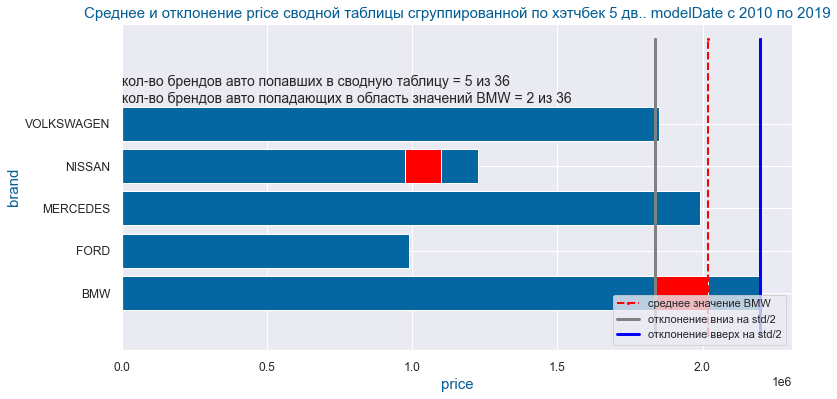

Список релевантных брендов:  MERCEDES VOLKSWAGEN


In [167]:
# посмотрим какие бренды в остальных (68-7=61) электрокаров трейна и как распределены по ним цены
temp_df = temp_df_Train[(temp_df_Train['fuelType']=='электро')] 
list_brand = utils.hbar_group_pivot_table(list_bodyType_test[3], 'price', temp_df, 2010, 2019, 1.1)

***Резюме по fuelType:-*** Категориальный признак. 4 значения ('газ' удалили). Электрокаров BMW в трейне - 7, в тесте - 1. Остальные 61 электрокар существенно ниже по цене, что может привести к снижению цены при моделировании БМВ. Кроме этого, визуальный осмотр значений электрокаров показал что стоит обратить внимание на обрабортку признака объем двигателя по этой группе. К сожалению нет фиксированной связи между можностью автомобиля и объемом двигателя, поэтому для моделирования важно сохранить оба признака, но по электрокарам нет значений и надо будет их как-то заполнить (может быть вывести из киловатов, но и они заполнены не везде)    

### 6.5 engineDisplacement

In [168]:
# обработаем значения с помощью регулярных выражений найдя значения объема в литра типа 2.0 и переведем их см3 
def engineDisplacement_to_float(row):
    row = str(row)
    volume = re.findall('\d\.\d', row)
    if volume == []:
        return None
    return int(float(volume[0])*1000)
df['engineDisplacement2'] = df['name'].apply(engineDisplacement_to_float)

In [169]:
# посмотрим сколько пропусков
len(df[df['engineDisplacement2'].isna()])

67

In [170]:
# подозрительно знакомое число видимо это электрокары, проверим 
df[df['engineDisplacement2'].isna()].fuelType.unique()

array(['электро'], dtype=object)

In [171]:
# посмотрим что там внутри 
temp_df_Train = df[df['Train']==1]
temp_df = temp_df_Train[temp_df_Train['engineDisplacement2'].isna() & (temp_df_Train['brand']=='BMW')]
display(temp_df.head(2))
display(temp_df.describe())

,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,price,start_date,Train,id,engineDisplacement2
8256,хэтчбек 5 дв.,BMW,серебристый,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC Electro,AUTOMATIC,Electro,170,Производство 12 месяц 2014 года. В наличии! Ав...,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,NaN,I3,89942.0,2013.0,2014.0,1430000.0,2020-08-17T08:51:48Z,1,NaN,NaN
8257,хэтчбек 5 дв.,BMW,белый,электро,Electro AT (126 кВт),5.0,HATCHBACK_5_DOORS AUTOMATIC Electro,AUTOMATIC,Electro,170,"Автомобиль в наличии Москве , с ПТС , производ...","{'id': '21624597', 'name': 'i3 120 Ah', 'avail...",задний,Левый,NaN,1 владелец,Оригинал,NaN,I3,25000.0,2017.0,2018.0,2319000.0,2020-08-22T09:38:05Z,1,NaN,NaN


,numberOfDoors,enginePower,mileage,modelDate,productionDate,price,Train,id,engineDisplacement2
count,7.0,7.0,7.000000,7.000000,7.000000,7.000000e+00,7.0,0.0,0.0
mean,5.0,170.0,48356.428571,2014.142857,2016.428571,2.017469e+06,1.0,NaN,NaN
std,0.0,0.0,26144.396735,1.951800,1.272418,3.601556e+05,0.0,NaN,NaN
min,5.0,170.0,20000.000000,2013.000000,2014.000000,1.430000e+06,1.0,NaN,NaN
25%,5.0,170.0,32250.000000,2013.000000,2016.000000,1.795000e+06,1.0,NaN,NaN
50%,5.0,170.0,41000.000000,2013.000000,2017.000000,2.099000e+06,1.0,NaN,NaN
75%,5.0,170.0,61526.500000,2015.000000,2017.000000,2.309000e+06,1.0,NaN,NaN
max,5.0,170.0,89942.000000,2017.000000,2018.000000,2.385286e+06,1.0,NaN,NaN


In [172]:
# чтож заполним пропуски аналогичными объемами двигателей автомобилей со следующими параметрами:
# 1 bodyType == хэтчбек 5 дв.
# 2 modelDate от 2013 до 2017
# 3 enginePower = около 170
# 4 price = 2.017469e+06	+ std(3.601556e+05) = (1657314, 2377624) 
# 5 brand == BMW
# 6 fuelType != 'электро'

temp_df = temp_df_Train[(temp_df_Train['bodyType']==list_bodyType_test[3]) & (temp_df_Train['brand']=='BMW') & (temp_df_Train['modelDate']>=2013) & (temp_df_Train['modelDate']<=2017)& (temp_df_Train['price']>=1657314) & (temp_df_Train['modelDate']<=2377624)& (temp_df_Train['enginePower']>=170-10) & (temp_df_Train['enginePower']<=170+10)& (temp_df_Train['fuelType']!='электро')]
display(temp_df.head(2))
display(temp_df.describe())

,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,price,start_date,Train,id,engineDisplacement2
8254,хэтчбек 5 дв.,BMW,серебристый,гибрид,94Ah 0.7hyb AT (170 л.с.),5.0,HATCHBACK_5_DOORS AUTOMATIC 94Ah,AUTOMATIC,94Ah,170,2017 год (выпущен в сентябре 2017 года) \n94 A...,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,"{'year': 2020, 'month': 4}",I3,23000.0,2013.0,2017.0,2331000.0,2020-08-30T20:10:49Z,1,NaN,700.0
8255,хэтчбек 5 дв.,BMW,чёрный,гибрид,94Ah 0.7hyb AT (170 л.с.),5.0,HATCHBACK_5_DOORS AUTOMATIC 94Ah,AUTOMATIC,94Ah,170,NaN,{'id': '0'},задний,Левый,NaN,1 владелец,Оригинал,NaN,I3,27000.0,2013.0,2017.0,1840000.0,2020-08-30T08:35:06Z,1,NaN,700.0


,numberOfDoors,enginePower,mileage,modelDate,productionDate,price,Train,id,engineDisplacement2
count,8.0,8.0,8.000000,8.00000,8.000000,8.000000e+00,8.0,0.0,8.0
mean,5.0,170.0,35856.125000,2014.00000,2016.625000,2.008125e+06,1.0,NaN,700.0
std,0.0,0.0,13522.039897,1.85164,1.407886,2.436505e+05,0.0,NaN,0.0
min,5.0,170.0,17000.000000,2013.00000,2014.000000,1.699000e+06,1.0,NaN,700.0
25%,5.0,170.0,26000.000000,2013.00000,2016.500000,1.830000e+06,1.0,NaN,700.0
50%,5.0,170.0,35797.500000,2013.00000,2017.000000,1.932500e+06,1.0,NaN,700.0
75%,5.0,170.0,44313.500000,2014.00000,2017.250000,2.257500e+06,1.0,NaN,700.0
max,5.0,170.0,57000.000000,2017.00000,2018.000000,2.331000e+06,1.0,NaN,700.0


In [173]:
# похоже что с такой низкой мощностью близкиеми оказались только гибриды, но 67 пропусков не так много - заполним мощность 700 см3
df['engineDisplacement2'].fillna(700, inplace = True)

In [174]:
# добавим мощность двигателя engineDisplacement2 в числовые признаки, а engineDisplacement удалим
cat_cols.remove('engineDisplacement') 
num_cols.append('engineDisplacement2')

In [175]:
utils.describe_without_plots('engineDisplacement2', df[df['Train']==1].engineDisplacement2)

,engineDisplacement2
кол-во строк,48705
тип значений,float64
кол-во значений,48705
кол-во NaN,0
среднее,2415.81
медиана,2000
мин,0
макс,8200


In [176]:
# надо посмотреть где получились нули
df[df['engineDisplacement2']==0].head(5)

,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,price,start_date,Train,id,engineDisplacement2
83620,внедорожник 5 дв.,MERCEDES,чёрный,электро,400 Electro AT (300.0 кВт) 4WD,5.0,ALLROAD_5_DOORS AUTOMATIC 400,AUTOMATIC,400,408,"Комплектация:\nСлужбы ""MB-Connect"" для навигац...","{'id': '0', 'name': ''}",полный,Левый,NaN,1 владелец,Оригинал,NaN,EQC,1771.0,2019.0,2020.0,7600000.0,2020-07-07T13:34:32Z,1,NaN,0.0
83621,внедорожник 5 дв.,MERCEDES,чёрный,электро,400 Electro AT (300.0 кВт) 4WD,5.0,ALLROAD_5_DOORS AUTOMATIC 400,AUTOMATIC,400,408,"2020 г. в. MERCEDES-BENZ EQC400 AWD, полный пр...","{'id': '0', 'name': ''}",полный,Левый,NaN,1 владелец,Оригинал,"{'year': 2020, 'month': 7}",EQC,90.0,2019.0,2020.0,8076322.0,2020-07-19T14:55:05Z,1,NaN,0.0


In [177]:
# это два электрокара 2019 года выпуска с ценой выше в 2 раза средней по BMW
# удаляем
df = df[df['engineDisplacement2']!=0]

In [178]:
utils.describe_without_plots('engineDisplacement2', df[df['Train']==1].engineDisplacement2)

,engineDisplacement2
кол-во строк,48703
тип значений,float64
кол-во значений,48703
кол-во NaN,0
среднее,2415.91
медиана,2000
мин,700
макс,8200


In [179]:
# а какой максимум по BMW в тесте
temp_df = df[df['Train']==0 & (df['brand']=='BMW')]
utils.describe_without_plots('engineDisplacement2', temp_df.engineDisplacement2)

,engineDisplacement2
кол-во строк,3837
тип значений,float64
кол-во значений,3837
кол-во NaN,0
среднее,2628.82
медиана,2500
мин,700
макс,6600


In [180]:
# какие авто с объемом двигателя более 6600 см3
temp_df= df[df['engineDisplacement2']>6600]
display(temp_df.head(3))
print(f'Кол-во авто с объемом двигателя более 6600 см3:= {len(temp_df)}')
print(f'Бренды авто с объемом двигателя более 6600 см3:= {list(temp_df.brand.unique())}')

,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Владение,model,mileage,modelDate,productionDate,price,start_date,Train,id,engineDisplacement2
11532,кабриолет,CADILLAC,белый,бензин,8.2 AT (218 л.с.),2.0,CABRIO AUTOMATIC 8.2,AUTOMATIC,8.2,218,После реставрация. \nНа учёте. Полностью честн...,{'id': '0'},передний,Левый,NaN,2 владельца,Оригинал,NaN,ELDORADO,25000.0,1971.0,1974.0,2600000.0,2020-07-15T21:21:02Z,1,NaN,8200.0
11683,седан,CADILLAC,белый,бензин,7.0 AT (313 л.с.),4.0,SEDAN AUTOMATIC 7.0,AUTOMATIC,7.0,313,Кадиллак флитвуд 1961 года! (КЦ! Бумаги есть о...,{'id': '0'},задний,Левый,NaN,3 или более,Оригинал,NaN,FLEETWOOD,70000.0,1956.0,1961.0,1650000.0,2020-01-09T23:12:05Z,1,NaN,7000.0
16098,седан,CHRYSLER,пурпурный,бензин,6.8 AT (340 л.с.),4.0,SEDAN AUTOMATIC 6.8,AUTOMATIC,6.8,340,"Крайслер Ньюйоркер 1961, хардтоп, мотор golden...",{'id': '0'},задний,Левый,NaN,1 владелец,Дубликат,"{'year': 2017, 'month': 2}",NEW_YORKER,70000.0,1960.0,1961.0,1600000.0,2020-07-19T07:43:31Z,1,NaN,6800.0


Кол-во авто с объемом двигателя более 6600 см3:= 9
Бренды авто с объемом двигателя более 6600 см3:= ['CADILLAC', 'CHRYSLER', 'FORD']


In [181]:
# удаляем эти 9
df = df[df['engineDisplacement2']<6600]

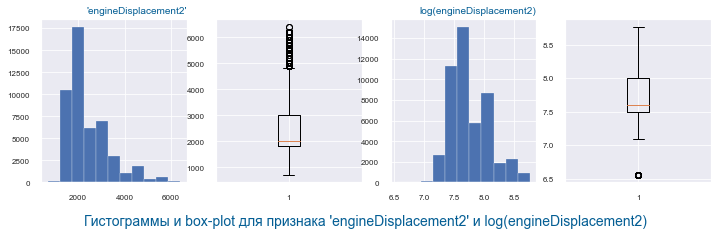

In [182]:
utils.four_plot_with_log2('engineDisplacement2', df[df['Train']==1])

In [183]:
# добавим новый признак логарифм
df['engineDisplacement2_log'] = np.log(df['engineDisplacement2'] + 1)
num_cols.append('engineDisplacement2_log')

***Резюме по engineDisplacement:-*** Создан новый числовой признак объем двигателя в см3. После обработки пропуски оказались по электромобилям. Заполнили пропуски средними значениями по похожим параметрам - ими оказались гибриды с объемом 700 см3. Также удалили выбросы по порогу мин-макс теста по БМВ. Распределение скорее логнормальное - создали новый признак engineDisplacement2_log. 

### 6.6 numberOfDoors

In [184]:
# переведем в int64 критерий numberOfDoors
df['numberOfDoors'] = df['numberOfDoors'].astype('int64')

In [185]:
utils.describe_without_plots('numberOfDoors', df[df['Train']==1].numberOfDoors)

,numberOfDoors
кол-во строк,48694
тип значений,int64
кол-во значений,48694
кол-во NaN,0
среднее,4.51592
медиана,5
мин,2
макс,5


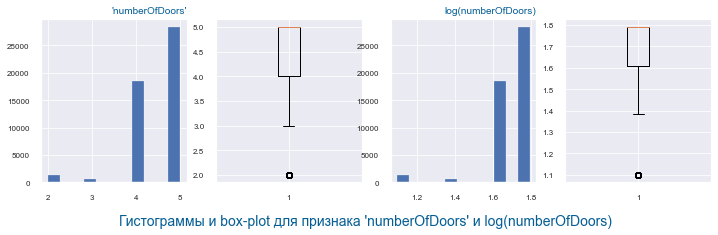

In [186]:
utils.four_plot_with_log2('numberOfDoors', df[df['Train']==1])

In [187]:
# фактически это категориальный признак с 4 значениями, но для корректной групповой обработки числовых признаков переведем его в числовые
cat_cols.remove('numberOfDoors')
num_cols.append('numberOfDoors')

### 6.7 Владельцы

In [188]:
# на этапе предварительного анализа были пропуски , проверим
len(df[df['Владельцы'].isna()])

8959

In [192]:
# статистика по значениям трейне
temp_df = df[df['Train']==1]
temp_df['Владельцы'].value_counts(normalize=True)

3 или более    0.499660
2 владельца    0.271222
1 владелец     0.229118
Name: Владельцы, dtype: float64

In [193]:
# статистика по значениям тесте
temp_df = df[df['Train']==0]
temp_df['Владельцы'].value_counts(normalize=True)

3 или более    0.395252
1 владелец     0.340986
2 владельца    0.263762
Name: Владельцы, dtype: float64

In [ ]:
# посмотрим на кол-во владельцев в зависимости от пробега по брендам
.....

In [194]:
# пока зполним '3 или более'
df['Владельцы'].fillna('3 или более', inplace=True)

In [195]:
# переведем в числовой формат 
# в тесте вытащим значение мощности перед первым пробелом'
df.loc[df['Train']==0, 'Владельцы'] = df[df['Train']==0]['Владельцы'].apply(lambda x: int(x.split()[0]))

In [197]:
# переведем в числовой формат 
# в тесте вытащим значение мощности перед первым пробелом'
df.loc[df['Train']==1, 'Владельцы'] = df[df['Train']==1]['Владельцы'].apply(lambda x: int(x.split()[0]))

In [198]:
# переводим в int64
df['Владельцы'] = df['Владельцы'].astype('int64')

In [199]:
utils.describe_without_plots('Владельцы', df[df['Train']==1]['Владельцы'])

,Владельцы
кол-во строк,48694
тип значений,int64
кол-во значений,48694
кол-во NaN,0
среднее,2.40475
медиана,3
мин,1
макс,3


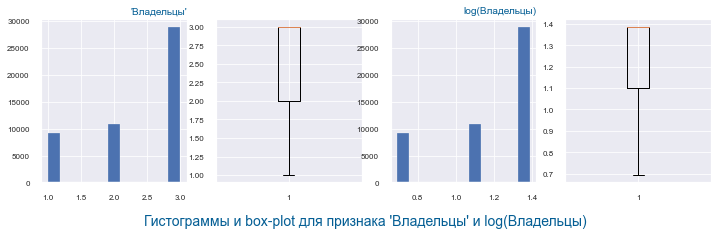

In [200]:
utils.four_plot_with_log2('Владельцы', df[df['Train']==1])

In [201]:
# фактически это категориальный признак с 3 значениями, но для корректной групповой обработки числовых признаков переведем его в числовые
cat_cols.remove('Владельцы')
num_cols.append('Владельцы')

In [41]:
# далее я еще не успел сделать EDA с выводами, а обработал признаки для моделирования и сабмита на кагл

In [255]:
# utils.describe_without_plots_all_collumns(df, short=True)

In [106]:
# удалим name и vehicleConfiguration так как это композиция других критериев в строчном виде
cat_cols.remove('name')
cat_cols.remove('vehicleConfiguration')

In [206]:
df['price'].fillna(df['price'].mean(), inplace = True)
# приведем числовые критерии к int64
for col in num_cols:
    df[col] = df[col].astype('int64')

In [208]:
# удалим признаки которые еще не обработали
list_cols_to_drop = ['description', 'Комплектация', 'Владение', 'Состояние', 'model', 'Руль']
for col in list_cols_to_drop:
    cat_cols.remove(col)

In [210]:
all_cols = num_cols+cat_cols+servis_cols
df = df.loc[:, all_cols]

## 5. Перекрестный анализ между переменными и целевой переменной price
---


### Оценка корреляций

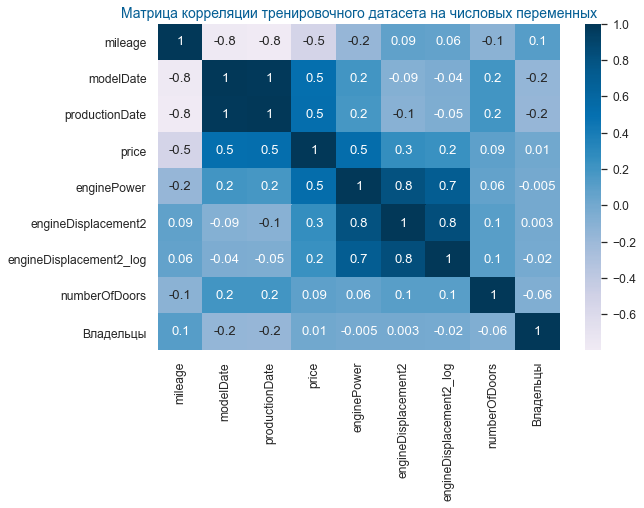

In [211]:

utils.simple_heatmap('Матрица корреляции тренировочного датасета на числовых переменных',df[df['Train']==1], num_cols, 1.1, 1, 9)

### Добавление новых признаков делением

### Значимость непрерывных переменных

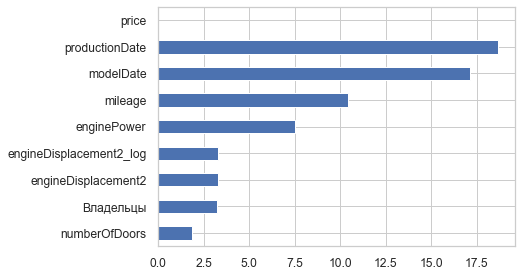

In [214]:
temp_df = df[df['Train']==1]
imp_num = pd.Series(f_classif(temp_df[num_cols], temp_df['price'])[0], index = num_cols)
imp_num.sort_values(inplace = True)
imp_num.plot(kind = 'barh')

## 6. Подготовка данных к машинному обучению
---
### Категориальные признаки


In [ ]:
# реализуем метод OneHotLabels через get_dummies
new_dumm_cat_cols = utils.get_dummies_df(df, cat_cols)
# мы специально не удаляем первоначальные столбы, чтобы потом можно было провести построчную проверку перед стандартизацией и моделированием

### Бинарные признаки

### Построчная верификация первых двух строк

In [217]:
display(df.head(2))

,mileage,modelDate,productionDate,price,enginePower,engineDisplacement2,engineDisplacement2_log,numberOfDoors,Владельцы,bodyType,brand,color,fuelType,name,vehicleConfiguration,vehicleTransmission,Привод,ПТС,Train,id
0,350000,1990,1991,200000,174,2800,7,4,3,седан,AUDI,чёрный,бензин,2.8 MT (174 л.с.) 4WD,SEDAN MECHANICAL 2.8,MECHANICAL,полный,Оригинал,1,NaN
1,173424,1982,1986,60000,90,1800,7,4,3,седан,AUDI,красный,бензин,1.8 MT (90 л.с.),SEDAN MECHANICAL 1.8,MECHANICAL,передний,Оригинал,1,NaN


### Стандартизация и заполнение пропусков

In [179]:
utils.StandardScaler_df_and_filna_0(df, num_cols)

### Удаление нечисловых критериев

In [180]:

df.drop(['education','app_date'], axis=1, inplace=True)

### Посмотрим на значимость категориальных и бинарных переменных 

In [221]:
temp_df = df[df['Train']==1]
imp_cat = pd.Series(mutual_info_classif(temp_df[cat_cols], temp_df['price'], discrete_features =True), index = cat_cols)
imp_cat.sort_values(inplace = True)
imp_cat.plot(kind = 'barh')

ValueError: could not convert string to float: 'седан'

## 7. Future engineering
---
### PolynomialFeatures

## 8. Построение модели
---
### Разбиваем датасет на тренировочный и тестовый

### Обучаем модель, генерируем результат и сравниваем с тестом

### Оценка качества модели
---
### Качественные метрики

In [190]:
# в первый раз инициируем глобальную переменную с предыдущим скором
my.last_pred = np.zeros((3,len(y_test)))

In [191]:
my.test_last_pred(y_test, y_pred, y_pred_prob) if (my.last_pred[0].max() == 0) else 0
my.all_metrics(y_test, y_pred, y_pred_prob)

,Значение,Дельта с предыдущим,Описание
accuracy,0.664401,0.0,(TP+TN)/(P+N)
balanced accuracy,0.663130,0.0,сбалансированная accuracy
precision,0.223284,0.0,точность = TP/(TP+FP)
recall,0.661426,0.0,полнота = TP/P
f1_score,0.333862,0.0,среднее гармоническое точности и полноты
roc_auc,0.724420,0.0,Area Under Curve - Receiver Operating Characte...


### Поиск оптимальных параметров модели

In [85]:
##Grid search
model = LogisticRegression(random_state=RANDOM_SEED)

# # первые параметры сетки поиска
# param_grid = [
#     {'penalty': ['l1'], 'solver': ['liblinear', 'saga'],'max_iter':[100],'tol':[1e-4]},
#     {'penalty': ['l2'], 'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],'max_iter':[100],'tol':[1e-4]},
#     {'penalty': ['none'], 'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'],'max_iter':[1000],'tol':[1e-4]},
# ]

param_grid = [
    {'penalty': ['l1'], 'solver': ['liblinear', 'saga'],'max_iter':[1000],'tol':[1e-5]},
    {'penalty': ['l2'], 'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],'max_iter':[1000],'tol':[1e-5]},
    {'penalty': ['none'], 'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'],'max_iter':[1000],'tol':[1e-5]},
]
gridsearch = GridSearchCV(model, param_grid, scoring='f1', n_jobs=-1, cv=5)
gridsearch.fit(X_train, y_train)
model = gridsearch.best_estimator_
##Print the best parameters
best_parameters = model.get_params()
for param_name in sorted(best_parameters.keys()):
        print('\t%s: %r' % (param_name, best_parameters[param_name]))
    ##Print the model scores
preds = model.predict(X_test)
print('Accuracy: %.4f' % accuracy_score(y_test, preds))
print('Precision: %.4f' % precision_score(y_test, preds))
print('Recall: %.4f' % recall_score(y_test, preds))
print('F1: %.4f' % f1_score(y_test, preds))

,Лучшие значения
Penalty,l2
C,1.9


### Отбор признаков

In [199]:
model = LogisticRegression(C=7, penalty='l2', multi_class = 'ovr', class_weight='balanced', solver='liblinear', random_state=RANDOM_SEED)

efs1 = EFS(model, 
           min_features=1,
           max_features=10,
           scoring='roc_auc',
           print_progress=True,
           cv=5)

efs1 = efs1.fit(X_train, y_train)

print('Best roc_auc score: %.2f' % efs1.best_score_)
print('Best subset (indices):', efs1.best_idx_)
print('Best subset (corresponding names):', efs1.best_feature_names_)

KeyboardInterrupt: 

### Кросс-валидация

In [195]:
model = LogisticRegression(C=7, penalty='l2', multi_class = 'ovr', class_weight='balanced', solver='liblinear') 
model.fit(X_train, y_train)

cross_val_score(model, X_test, y_test, cv=10, scoring='roc_auc')

array([0.70712468, 0.7086355 , 0.73762723, 0.70977903, 0.76377662,
       0.75701085, 0.69885094, 0.67932503, 0.71519486, 0.73579256])

## Submission

In [196]:
train_data = df_with_poly.query('Train != 3').drop(['Train']+first_drop_list_columns, axis=1)
test_data = df_with_poly.query('Train == 3').drop(['Train']+first_drop_list_columns, axis=1)

In [197]:
X_train=train_data.drop(['default_x'], axis=1)
y_train = train_data.default_x.values
X_test = test_data.drop(['default_x'], axis=1)

In [198]:
# проверяем
test_data.shape, train_data.shape, X_train.shape, y_train.shape, X_test.shape

((36349, 53), (73799, 53), (73799, 52), (73799,), (36349, 52))

In [199]:
model = LogisticRegression(C=7, penalty='l2', multi_class = 'ovr', class_weight='balanced', solver='liblinear', random_state=RANDOM_SEED)

model.fit(X_train, y_train)

LogisticRegression(C=7, class_weight='balanced', dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='ovr', n_jobs=None, penalty='l2',
                   random_state=42, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [200]:
y_pred_prob = model.predict_proba(X_test)[:,1]


submit = pd.DataFrame(df_test.client_id)
submit['default']=y_pred_prob
submit.to_csv('submission.csv', index=False)